In [1]:
import scanpy as sc
import muon as mu
import numpy as np
import pandas as pd
import seaborn as sns
import scvi
import glob
import matplotlib.pyplot as plt

sc.settings.n_jobs = 16
scvi.settings.num_threads = 1
scvi.train.Trainer(accelerator = 'mps')
sc.set_figure_params(dpi=100,dpi_save=800, figsize=(5,5), frameon=False)
%config InlineBackend.figure_format='retina'

Global seed set to 0
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/flax/struct.py:132: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(data_clz, keypaths)
GPU available: True (mps), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [2]:
mdata = mu.read("./Results_h5ad/02_mdata_mvi_obs_edit.h5mu")

# Split Mudata for RNA only

In [3]:
adata_rna = mdata['rna']
adata_rna.var['mt'] = adata_rna.var_names.str.startswith('mt')
sc.pp.calculate_qc_metrics(adata_rna, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True, layer='counts')
adata_rna = mdata['rna'].copy()

# Load the pre-trained models

In [6]:
lvae = scvi.model.SCANVI.load('./scanvi_model')
lvae.to_device('mps')

INFO     File ./scanvi_model/model.pt already downloaded                                                           


In [7]:
lvae.prepare_query_anndata(adata_rna, lvae)

INFO     Found 90.33655448183939% reference vars in query data.                                                    


/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scvi/model/base/_archesmixin.py:210: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata_padding = AnnData(


In [9]:
adata_rna.obs['celltype_scanvi'] = 'Unknown'

In [10]:
mdata = mu.read("./Results_h5ad/02_mdata_mvi_obs_edit.h5mu")

In [11]:
mdata.obs["scANVI_pred"] = lvae.predict(adata_rna)
mdata.obsm["X_scANVI"] = lvae.get_latent_representation(adata_rna)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [12]:
del lvae

In [13]:
vae = scvi.model.SCVI.load('./scvi_model')
vae.to_device('mps')

INFO     File ./scvi_model/model.pt already downloaded                                                             


In [14]:
mdata.obsm["X_scVI"] = vae.get_latent_representation(adata_rna)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [15]:
sc.pp.neighbors(mdata, n_neighbors=100, use_rep="X_scVI")
sc.tl.umap(mdata, min_dist=0.5)
mdata.obsm['X_umapSCVI'] = mdata.obsm['X_umap'].copy()
sc.pp.neighbors(mdata, n_neighbors=100, use_rep="X_scANVI")
sc.tl.umap(mdata, min_dist=0.5)
sc.tl.leiden(mdata, resolution=0.1)
mdata.obsm['X_umapSCANVI'] = mdata.obsm['X_umap'].copy()

In [17]:
# fix the wrong predicted cell type
mdata.obs.scANVI_pred[(mdata.obs.leiden == '0') & (mdata.obs.scANVI_pred == 'Smooth Muscle')] = 'PEP1'

In [7]:
mdata.obs["MetaType"] = mdata.obs.scANVI_pred.astype(str).copy()
mdata.obs.MetaType = mdata.obs.MetaType.replace(['NF1','NF2','NF3','NP','PEP1','PEP2','SST','cLTMR1','p_cLTMR2'], 'Neurons')
mdata.obs["NociceptiveType"] = mdata.obs.scANVI_pred.astype(str).copy()
mdata.obs.NociceptiveType = mdata.obs.NociceptiveType.replace(['NP','PEP1','PEP2','SST','cLTMR1','p_cLTMR2'], 'Nociceptors')

In [10]:
mdata.write("./Results_h5ad/02_mdata_mvi_scANVI_pred.h5mu")

In [3]:
mdata = mu.read("./Results_h5ad/02_mdata_mvi_scANVI_pred.h5mu")

In [23]:
mdata['rna'].obsm['X_multiVI'] = mdata.obsm['X_multiVI']
mdata['rna'].obsm['X_scANVI'] = mdata.obsm['X_scANVI']
mdata['rna'].obsm['X_scVI'] = mdata.obsm['X_scVI']
mdata['rna'].obs['scANVI_pred'] = mdata.obs['scANVI_pred']

In [2]:
# from scib_metrics.benchmark import Benchmarker

# bm = Benchmarker(
#     mdata['rna'],
#     batch_key="Source",
#     label_key="scANVI_pred",
#     embedding_obsm_keys=["X_scANVI", "X_scVI", "X_multiVI"],
#     # pre_integrated_embedding_obsm_key="X_pca",
#     n_jobs=-1,
# )
# bm.benchmark()

In [ ]:
# bm.plot_results_table()

In [24]:
mdata.mod['rna'].obs['scANVI_pred'] = mdata.obs['scANVI_pred'].copy()
mdata.mod['rna'].uns['scANVI_pred_colors'] = mdata.uns['scANVI_pred_colors'].copy()
mdata.mod['rna'].obs['MetaType'] = mdata.obs['MetaType'].copy()
mdata.mod['rna'].uns['MetaType_colors'] = mdata.uns['MetaType_colors'].copy()
mdata.mod['rna'].obs['NociceptiveType'] = mdata.obs['NociceptiveType'].copy()
mdata.mod['rna'].uns['NociceptiveType_colors'] = mdata.uns['NociceptiveType_colors'].copy()

In [30]:
mdata.write("./Results_h5ad/02_mdata_mvi_annotated.h5mu")

In [5]:
mdata = mdata[~mdata.obs.scANVI_pred.isin(['Repair fibroblast','Repair schwann','Schwann_N','Schwann_M'])].copy()
mdata.write("./Results_h5ad/02_mdata_mvi_Injury_state_edit.h5mu")

In [6]:
mdata['rna'].obs['scANVI_pred'] = mdata.obs['scANVI_pred'].copy()
mdata['rna'].obsm['X_scANVI'] = mdata.obsm['X_scANVI'].copy()

In [7]:
sc.pp.neighbors(mdata, n_neighbors=100, use_rep="X_scANVI", metric='cosine')
sc.tl.umap(mdata, min_dist=0.5)
sc.tl.leiden(mdata, resolution=0.1)
mdata.obsm['X_umapSCANVI'] = mdata.obsm['X_umap'].copy()

In [28]:
mdata = mu.read("./Results_h5ad/02_mdata_mvi_Injury_state_edit.h5mu")

In [29]:
mdata.obs.scANVI_pred = mdata.obs.scANVI_pred.cat.remove_unused_categories()
mdata.obs.MetaType = mdata.obs.MetaType.cat.remove_unused_categories()
mdata.obs.NociceptiveType = mdata.obs.NociceptiveType.cat.remove_unused_categories()

In [89]:
mdata.obs["Technology"] = mdata['rna'].obs["Technology"]

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


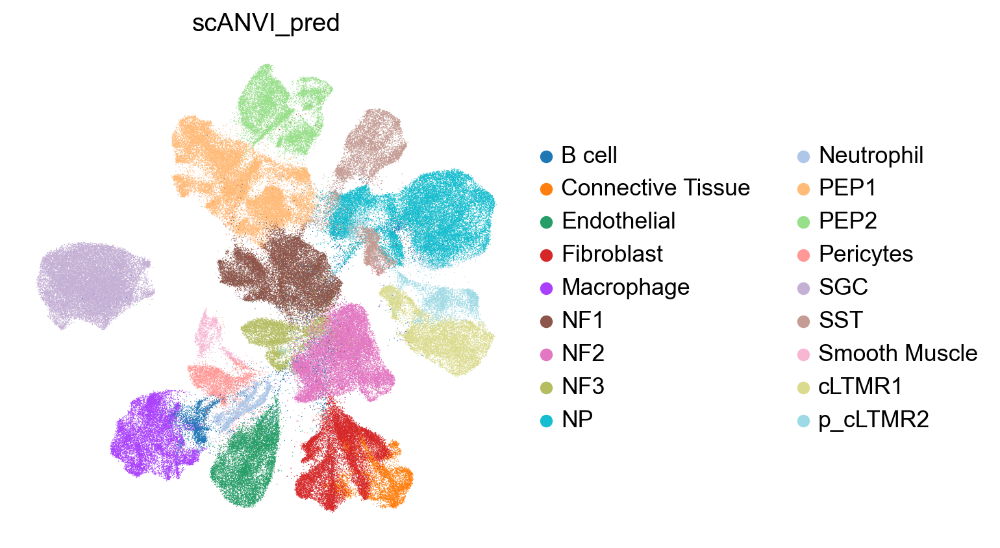

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


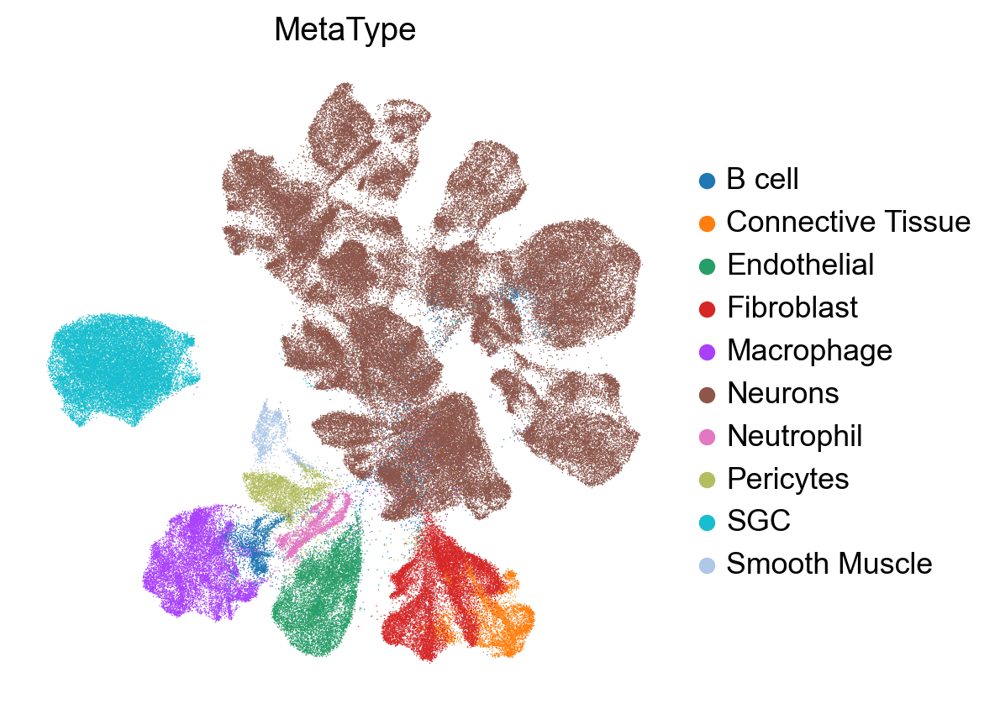

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


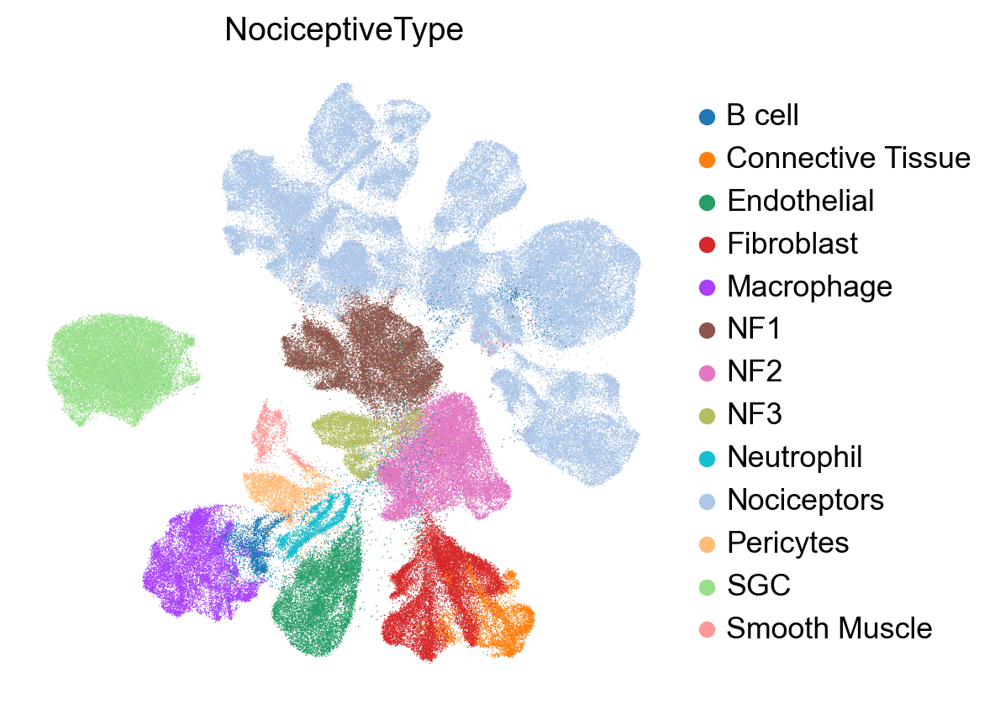

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


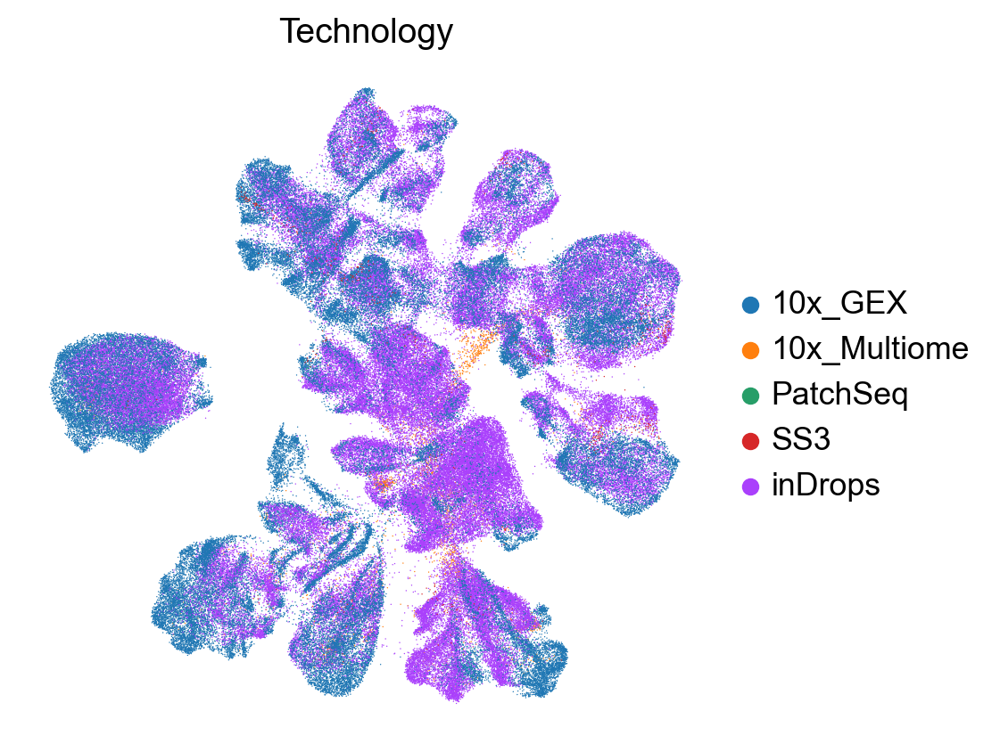

In [91]:
mu.pl.umap(mdata, color=["scANVI_pred"], size=1)
sc.pl.umap(mdata, color=["MetaType"], size=1)
mu.pl.umap(mdata, color=["NociceptiveType"], size=1)
mu.pl.umap(mdata, color=["Technology"], size=1)

In [2]:
mdata = mu.read("./Results_h5ad/02_mdata_mvi_Injury_state_edit.h5mu")

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Axes: title={'center': 'scANVI_pred'}, xlabel='X_umap1', ylabel='X_umap2'>

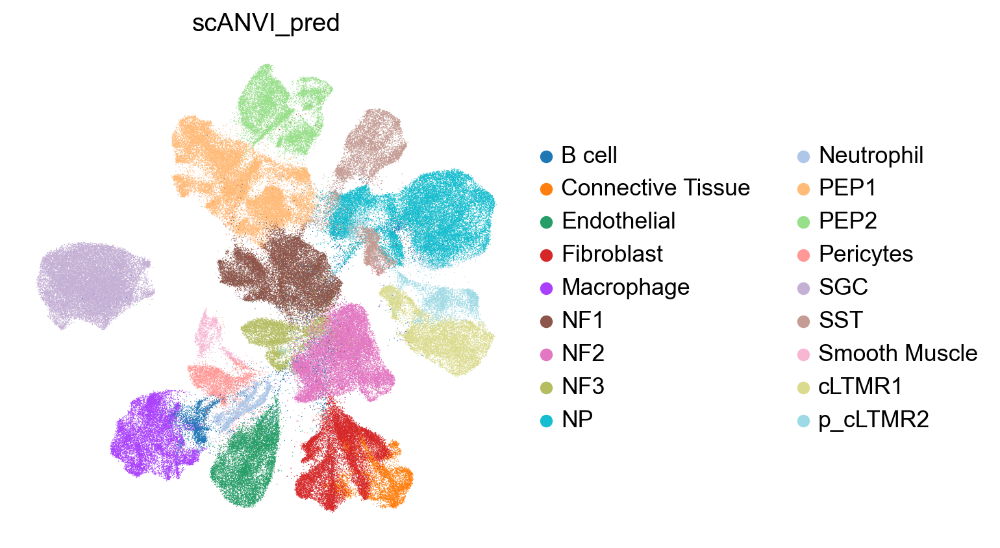

In [10]:
fig, ax = plt.subplots(figsize=(5,5))
mu.pl.umap(mdata, color=["scANVI_pred"], size=1, show=False, ax=ax)
fig.savefig("/Users/pax/Manu_fig/main_umap.pdf")

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


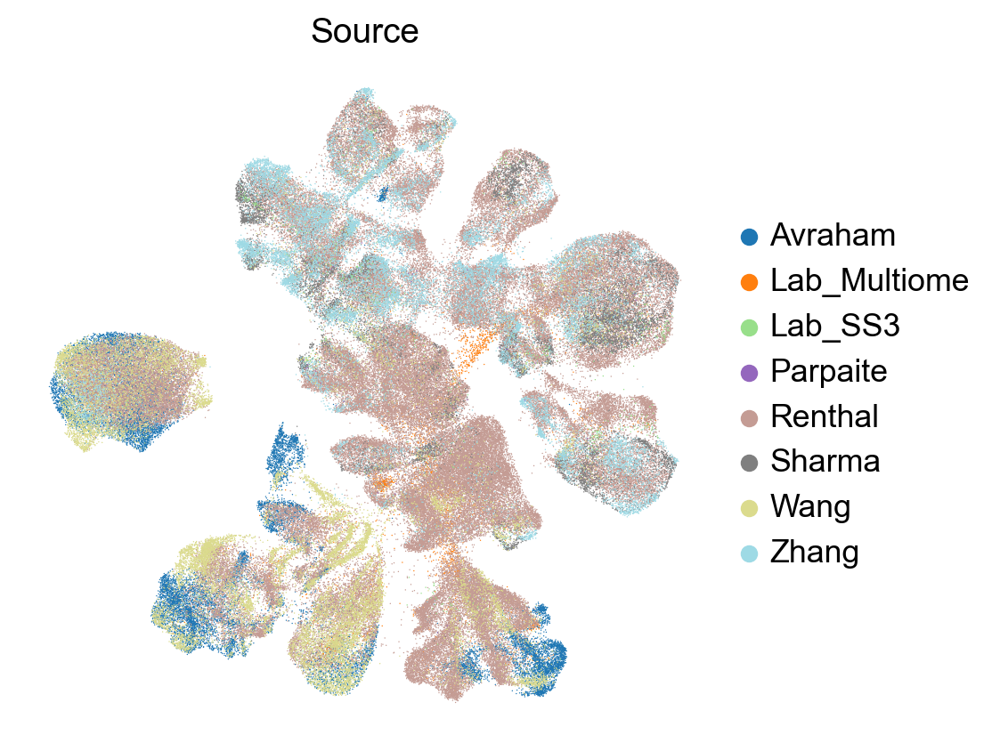

In [6]:
fig, ax = plt.subplots(figsize=(5,5))
mu.pl.umap(mdata, color=["Source"], size=1, show=False, ax=ax, palette='tab20')

In [20]:
pal = {'Avraham': '#98df8a',
 'Lab_Multiome': '#9467bd',
 'Lab_SS3': '#1f77b4',
 'Parpaite': '#ff7f0e',
 'Renthal': '#c49c94',
 'Sharma': '#7f7f7f',
 'Wang': '#dbdb8d',
 'Zhang': '#9edae5'}

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


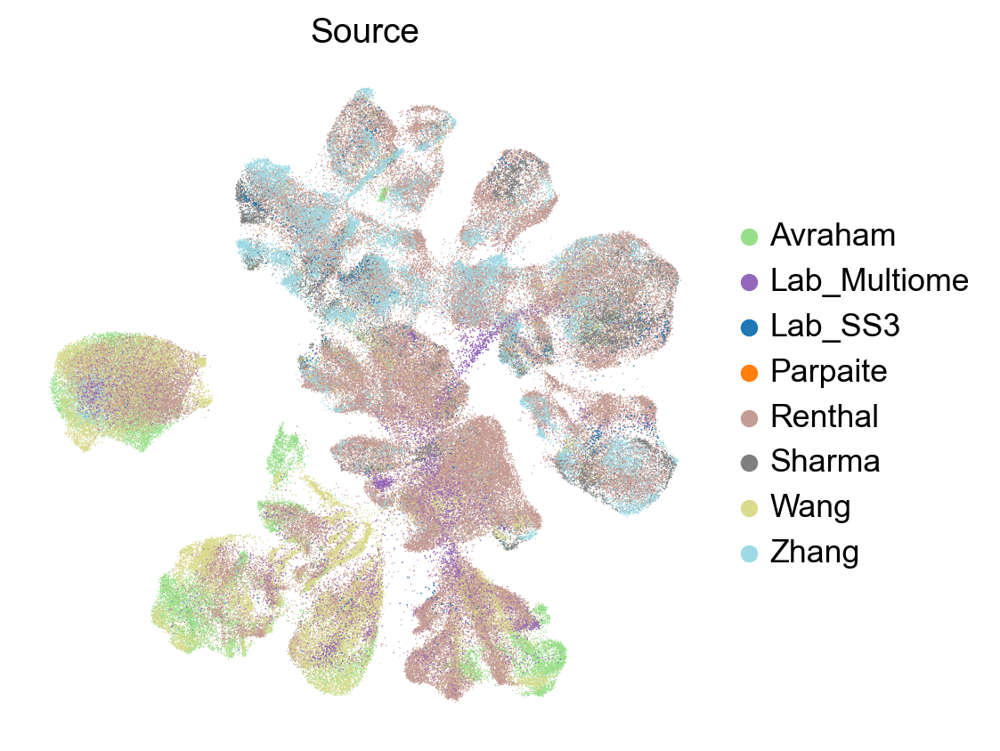

In [26]:
fig, ax = plt.subplots(figsize=(5,5))
mu.pl.umap(mdata, color=["Source"], size=1, show=False, ax=ax, palette=pal)
mu.pl.umap(mdata[mdata.obs.Source == 'Lab_SS3'], color=["Source"], size=1, show=False, ax=ax, palette=pal, legend_loc=None)
mu.pl.umap(mdata[mdata.obs.Source == 'Lab_Multiome'], color=["Source"], size=1, show=False, ax=ax, palette=pal, legend_loc=None)
fig.savefig("/Users/pax/Manu_fig/eps/main_umap_source.eps", bbox_inches='tight')
fig.savefig("/Users/pax/Manu_fig/main_umap_source.pdf", bbox_inches='tight')

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


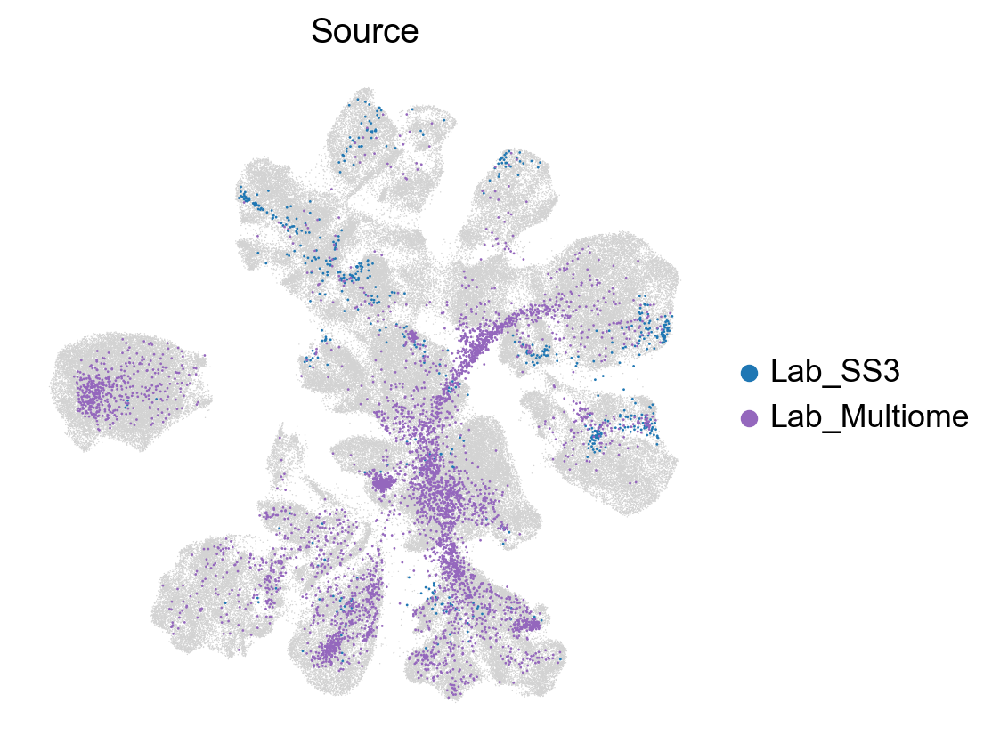

In [32]:
fig, ax = plt.subplots(figsize=(5,5))
mu.pl.umap(mdata, size=1, show=False, ax=ax)
mu.pl.umap(mdata[mdata.obs.Source == 'Lab_SS3'], color=["Source"], groups='Lab_SS3', size=4, show=False, ax=ax, palette=pal, na_in_legend=False)
mu.pl.umap(mdata[mdata.obs.Source == 'Lab_Multiome'], color=["Source"], groups='Lab_Multiome', size=4, show=False, ax=ax, palette=pal, na_in_legend=False)
fig.savefig("/Users/pax/Manu_fig/main_umap_source_highlight.pdf", bbox_inches='tight')

In [7]:
mdata.obs['Neuronal'] = mdata.obs['MetaType'].map(lambda x: 'Neurons' if x == 'Neurons' else 'Non-Neuronal')

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


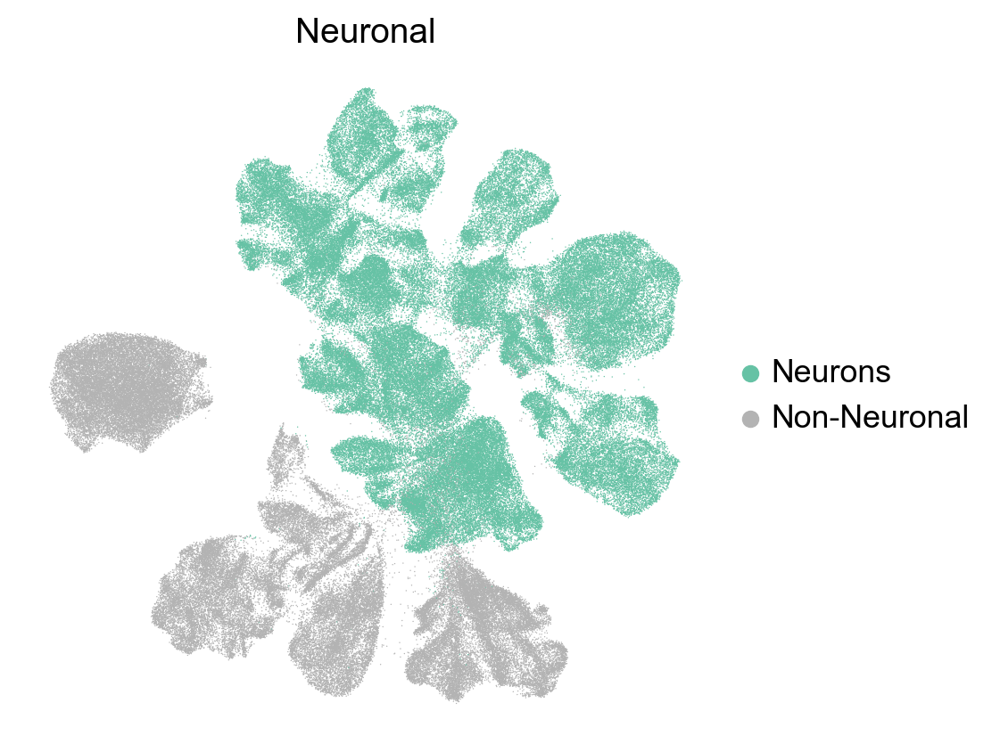

In [10]:
fig, ax = plt.subplots(figsize=(5,5))
mu.pl.umap(mdata, color=["Neuronal"], size=1, show=False, ax=ax, palette='Set2')
fig.savefig("/Users/pax/Manu_fig/eps/main_umap_Neuronal.eps")

In [15]:
for i in ['scANVI_pred', 'Neuronal', 'Source']:
    mdata.obs[i].value_counts().to_frame().to_excel(f'./Results_xlsx/03_cellcount_{i}.xlsx')

In [14]:
mdata_ref = mdata[mdata.obs.Time == '0day'].copy()

In [20]:
sc.tl.dendrogram(
    mdata_ref['rna'], 
    groupby = "scANVI_pred", 
    use_rep = "X_scANVI"
)

In [16]:
mdata_ref['rna'].X = mdata_ref['rna'].layers['counts'].copy()
sc.pp.normalize_total(mdata_ref['rna'])
sc.pp.log1p(mdata_ref['rna'])
mdata_ref['rna'].layers['log1p'] = mdata_ref['rna'].X.copy()

In [12]:
sc.tl.rank_genes_groups(mdata_ref['rna'], groupby='scANVI_pred', method='wilcoxon', use_raw=False, layer='log1p')

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


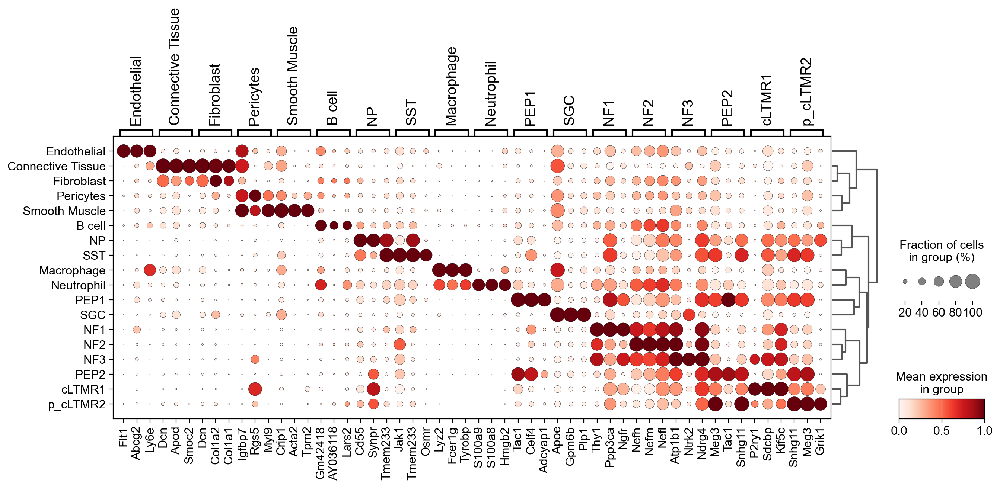

In [ ]:
sc.pl.rank_genes_groups_dotplot(mdata_ref['rna'], groupby='scANVI_pred', n_genes=3, layer='log1p', standard_scale='var', use_raw=False, figsize=(15,5))

In [16]:
de_mk = sc.get.rank_genes_groups_df(mdata_ref['rna'], group=None, pval_cutoff=0.05, log2fc_min=0)

In [17]:
de_mk.to_excel('Results_xlsx/03_CellType_Classify_mk_wilcoxon.xlsx')

In [6]:
mvi = scvi.model.MULTIVI.load('./multivi_model')

INFO     File ./multivi_model/model.pt already downloaded                                                          


/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/torch/nn/init.py:405: UserWarning: Initializing zero-element tensors is a no-op
  warnings.warn("Initializing zero-element tensors is a no-op")


In [7]:
adata = mvi.adata[mdata_ref.obs_names].copy()
adata.obs['scANVI_pred'] = mdata_ref.obs['scANVI_pred'].copy()

In [8]:
de_all_cell = mvi.differential_expression(adata, groupby='scANVI_pred', mode='change', delta=0.25)

INFO     AnnData object appears to be a copy. Attempting to transfer setup.                                        
DE...: 100%|██████████| 18/18 [02:48<00:00,  9.34s/it]


In [10]:
de_all_cell_filtered = de_all_cell[(de_all_cell.bayes_factor > 3) & (de_all_cell['is_de_fdr_0.05']) & (de_all_cell.lfc_median > 0) & (de_all_cell.non_zeros_proportion1 > 0.1)]

In [25]:
de_all_cell_filtered.to_excel('Results_xlsx/03_CellType_Classify_mk.xlsx')

In [10]:
de_all_cell_filtered = pd.read_excel('Results_xlsx/03_CellType_Classify_mk.xlsx', index_col=0)

In [11]:
markers = {}
cats = mdata.obs.scANVI_pred.cat.categories

for i, c in enumerate(cats):
    cid = "{} vs Rest".format(c)
    cell_type_df = de_all_cell_filtered.loc[de_all_cell_filtered.comparison == cid]
    
    cell_type_df = cell_type_df[cell_type_df['is_de_fdr_0.05']]
    cell_type_df = cell_type_df[cell_type_df.lfc_median > 3]
    
    cell_type_df = cell_type_df[cell_type_df["bayes_factor"] > 3]
    cell_type_df = cell_type_df[cell_type_df["non_zeros_proportion1"] > 0.1]
    
    markers[c] = cell_type_df.index.tolist()[:3]

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


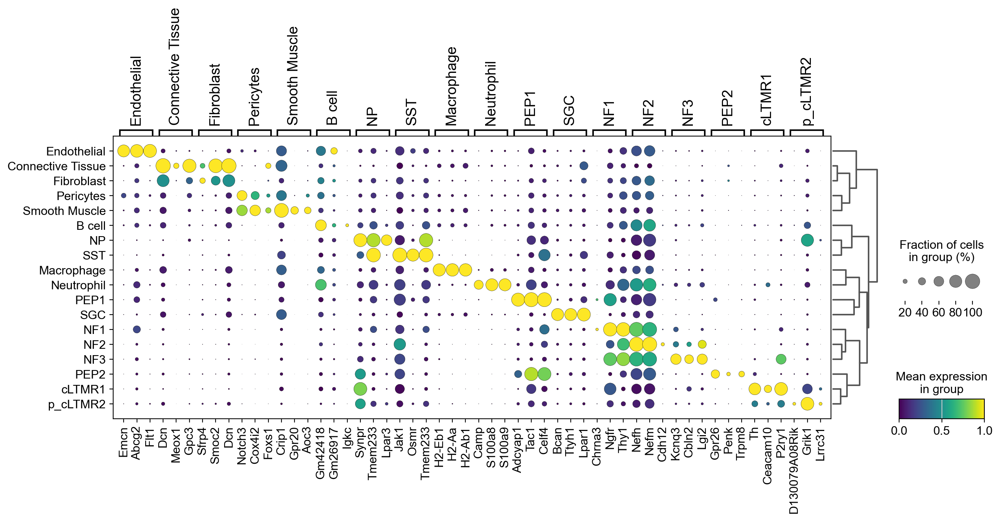

In [13]:
sc.pl.dotplot(
    mdata_ref['rna'],
    markers,
    groupby = "scANVI_pred",
    dendrogram = True,
    color_map = "viridis",
    swap_axes = False,
    use_raw = False,
    standard_scale = "var",
    layer='log1p',
    figsize=(15,5),
    save = "Main_dotplot_viridis.pdf"
)

In [22]:
markers = {
    'B cell': ['Cd79a', 'Ighd'],
    'Connective Tissue': ['Gpc3','Dcn'],
    'Endothelial': ['Pecam1','Cldn5'],
    'Fibroblast': ['Dcn','Mgp'],
    'Macrophage': ['Lyz2','Mrc1'],
    'NF1': ['Nefh','Hapln4','Htr3a','Cplx2'],
    'NF2': ['Nefh','Hapln4','Pvalb','Calb1'],
    'NF3': ['Nefh','Cadps2','Ntrk2'],
    'NP': ['Cd55','Mrgprd','Lpar3'],
    'Neutrophil': ['S100a8','Retnlg'],
    'PEP1': ['Tac1','Gpx3','Cartpt'],
    'PEP2': ['Tac1','Hpca','Trpm8'],
    'Pericytes': ['Pdgfrb','Notch3'],
    'SGC': ['Apoe','Fabp7','Ednrb'],
    'SST': ['Nppb','Sst','Il31ra'],
    'Smooth Muscle': ['Crip1','Aoc3'],
    'cLTMR1': ['Kif5c','Th'],
    'p_cLTMR2': ['Adamts9','Th'],
}

/Users/pax/miniconda3/envs/injury_atlas/lib/python3.10/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


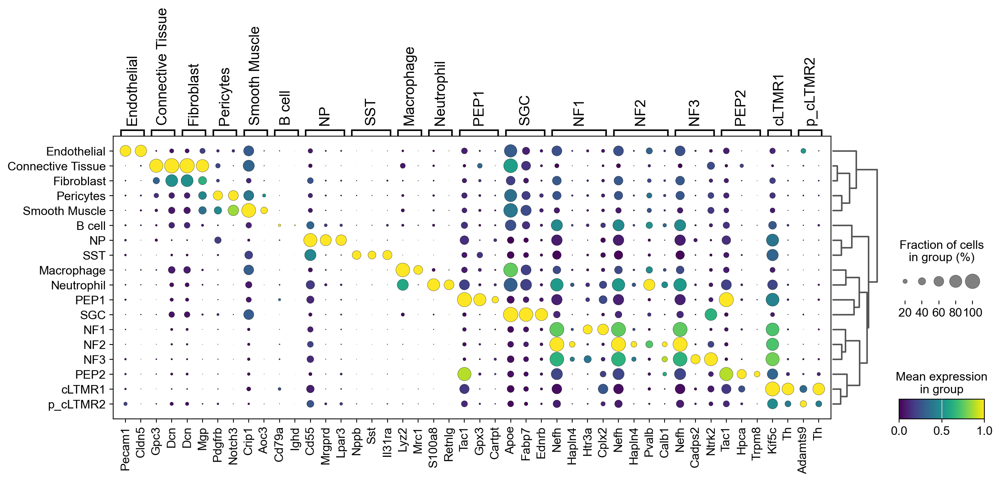

In [23]:
sc.pl.dotplot(
    mdata_ref['rna'],
    markers,
    groupby = "scANVI_pred",
    dendrogram = True,
    color_map = "viridis",
    swap_axes = False,
    use_raw = False,
    standard_scale = "var",
    layer='log1p',
    figsize=(15,5),
    # save = "scRNA-seq_dotplot.pdf"
)